In [1]:
%%capture
!pip install -qq scikit-learn==1.7.2
try:
    from hillclimbers import climb_hill, partial
except:
    !pip install -U hillclimbers
    from hillclimbers import climb_hill, partial

In [2]:
## -- Set Device-Agnostic code --
import torch
print(f"ℹ️ Cuda available: {torch.cuda.is_available()}")

if torch.cuda.is_available():
    get_ipython().run_line_magic('load_ext', 'cudf.pandas')
    get_ipython().run_line_magic('load_ext', 'cuml.accel')
else:
    pass

ℹ️ Cuda available: False


In [3]:
## -- IMPORT LIBRARIES --
import sys, os, gc

## -- DATA MANIPUALATION --
import numpy as np, pandas as pd, random

## -- VISUALISATION --
from IPython.display import display, Image
import matplotlib.pyplot as plt
import seaborn as sns
import shap

## -- FUNCTIONAL TOOLS --
from time import time, sleep
from tqdm.notebook import tqdm
from itertools import combinations, product

## -- MACHINE LEARNING --
import sklearn

from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import (
                StandardScaler,
                RobustScaler,
                OneHotEncoder,
                TargetEncoder
)
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.metrics import (
                roc_auc_score,
                RocCurveDisplay,
                ConfusionMatrixDisplay,
                classification_report
)

import warnings

In [4]:
print(f"sklearn version: {sklearn.__version__}")

sklearn version: 1.7.2


In [5]:
## -- Global Settings --
# sklearn.set_config(transform_output="pandas")
warnings.simplefilter('ignore')
warnings.filterwarnings('ignore')

# pd.options.mode.copy_on_write = True
pd.set_option('display.max_columns', 1000)
# plt.style.use("ggplot")
sns.set_style("darkgrid")
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

## -- Set Global Seed --
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

COLOR = '\033[32m'
RESET = '\033[0m'

# from google.colab import data_table
# data_table.enable_dataframe_formatter()

In [6]:
### Load Data ###
PATH = "/kaggle/input/playground-series-s5e11/"
submit = pd.read_csv(PATH+"sample_submission.csv")
trn = pd.read_csv(PATH+"train.csv",index_col='id') #.drop('id', axis=1)
tst = pd.read_csv(PATH+"test.csv", index_col='id') #.drop('id', axis=1)

TARGET = "loan_paid_back"
NUMS = tst.select_dtypes(include='number').columns.tolist()
CATS = tst.select_dtypes(exclude='number').columns.tolist()
BASE = NUMS + CATS

ORIG_PATH = "/kaggle/input/loan-prediction-dataset-2025/"
orig = pd.read_csv(ORIG_PATH+"loan_dataset_20000.csv")[BASE+[TARGET]]

for (name, df) in dict(Train=trn, Test=tst, Original=orig).items():
    print(f"{name} shape: {df.shape}")

print(f"\nTotal Numerical: {len(NUMS)}")
print(f"Total Categorical: {len(CATS)}")
print(f"Total base features: {len(BASE)}")

Train shape: (593994, 12)
Test shape: (254569, 11)
Original shape: (20000, 12)

Total Numerical: 5
Total Categorical: 6
Total base features: 11


In [7]:
# ### Load Data ###
# submit = pd.read_csv("sample_submission.csv")
# train = pd.read_csv("train.csv",index_col='id') #.drop('id', axis=1)
# test = pd.read_csv("test.csv", index_col='id') #.drop('id', axis=1)

# TARGET = "loan_paid_back"
# NUMS = test.select_dtypes(include='number').columns.tolist()
# CATS = test.select_dtypes(exclude='number').columns.tolist()
# BASE = NUMS + CATS

# orig = pd.read_csv("loan_dataset_20000.csv")[BASE+[TARGET]]

# for (name, df) in dict(Train=train, Test=test, Original=orig).items():
#     print(f"{name} shape: {df.shape}")

# print(f"\nTotal Numerical: {len(NUMS)}")
# print(f"Total Categorical: {len(CATS)}")
# print(f"Total base features: {len(BASE)}")

In [8]:
# display(test.head())
trn.info()

<class 'pandas.core.frame.DataFrame'>
Index: 593994 entries, 0 to 593993
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   annual_income         593994 non-null  float64
 1   debt_to_income_ratio  593994 non-null  float64
 2   credit_score          593994 non-null  int64  
 3   loan_amount           593994 non-null  float64
 4   interest_rate         593994 non-null  float64
 5   gender                593994 non-null  object 
 6   marital_status        593994 non-null  object 
 7   education_level       593994 non-null  object 
 8   employment_status     593994 non-null  object 
 9   loan_purpose          593994 non-null  object 
 10  grade_subgrade        593994 non-null  object 
 11  loan_paid_back        593994 non-null  float64
dtypes: float64(5), int64(1), object(6)
memory usage: 58.9+ MB


In [9]:
trn.head()

,annual_income,debt_to_income_ratio,credit_score,loan_amount,interest_rate,gender,marital_status,education_level,employment_status,loan_purpose,grade_subgrade,loan_paid_back
id,,,,,,,,,,,,
0,29367.99,0.084,736,2528.42,13.67,Female,Single,High School,Self-employed,Other,C3,1.0
1,22108.02,0.166,636,4593.10,12.92,Male,Married,Master's,Employed,Debt consolidation,D3,0.0
2,49566.20,0.097,694,17005.15,9.76,Male,Single,High School,Employed,Debt consolidation,C5,1.0
3,46858.25,0.065,533,4682.48,16.10,Female,Single,High School,Employed,Debt consolidation,F1,1.0
4,25496.70,0.053,665,12184.43,10.21,Male,Married,High School,Employed,Other,D1,1.0


In [10]:
trn.describe().T

,count,mean,std,min,25%,50%,75%,max
annual_income,593994.0,48212.202976,26711.942078,6002.430,27934.400,46557.680,60981.320,393381.740
debt_to_income_ratio,593994.0,0.120696,0.068573,0.011,0.072,0.096,0.156,0.627
credit_score,593994.0,680.916009,55.424956,395.000,646.000,682.000,719.000,849.000
loan_amount,593994.0,15020.297629,6926.530568,500.090,10279.620,15000.220,18858.580,48959.950
interest_rate,593994.0,12.356345,2.008959,3.200,10.990,12.370,13.680,20.990
loan_paid_back,593994.0,0.798820,0.400883,0.000,1.000,1.000,1.000,1.000


In [11]:
tst.describe().T

,count,mean,std,min,25%,50%,75%,max
annual_income,254569.0,48233.080193,26719.658580,6011.770,27950.300,46528.980,61149.440,380653.940
debt_to_income_ratio,254569.0,0.120583,0.068582,0.011,0.072,0.096,0.156,0.627
credit_score,254569.0,681.037691,55.624118,395.000,646.000,683.000,719.000,849.000
loan_amount,254569.0,15016.753484,6922.165182,500.050,10248.580,15000.220,18831.460,48959.260
interest_rate,254569.0,12.352323,2.017602,3.200,10.980,12.370,13.690,21.290


In [12]:
trn.nunique(dropna=False).sort_values(ascending=False)

annual_income           119728
loan_amount             111570
interest_rate             1454
debt_to_income_ratio       526
credit_score               399
grade_subgrade              30
loan_purpose                 8
education_level              5
employment_status            5
marital_status               4
gender                       3
loan_paid_back               2
dtype: int64

### FEATURE ENGINEERING

In [13]:
## -- Use formulated feature as input --
combine = pd.concat([trn, tst], ignore_index=True)

# grade_mapping = {'A': 6, 'B': 5, 'C': 4, 'D': 3, 'E': 2, 'F': 1}
# combine['grade'] = combine['grade_subgrade'].str[0]
# combine['grade'] = combine['grade'].map(grade_mapping)

combine['credit-X1-dti'] = combine['credit_score'] * (1 - combine['debt_to_income_ratio'])
combine['loan-income-ratio'] = combine['loan_amount'] / combine['annual_income']
combine['log_annual_income'] = np.log(combine['annual_income'])
# combine['log_loan_to_income'] = np.log(combine['loan_amount']) - np.log(combine['annual_income'])

train = combine[:len(trn)]
test = combine[-len(tst):].drop([TARGET], axis=1)

BASE.extend(['credit-X1-dti','loan-income-ratio','log_annual_income'])# ,'log_loan_to_income'
print("Train shape:", train.shape, "Test shape:", test.shape)
train.nunique(dropna=False).sort_values(ascending=False)

Train shape: (593994, 15) Test shape: (254569, 14)


loan-income-ratio       591310
annual_income           119728
log_annual_income       119728
loan_amount             111570
credit-X1-dti            63907
interest_rate             1454
debt_to_income_ratio       526
credit_score               399
grade_subgrade              30
loan_purpose                 8
education_level              5
employment_status            5
marital_status               4
gender                       3
loan_paid_back               2
dtype: int64

# INTERACTIONS & BINS

In [14]:
## -> value-based cuts --
BINS = []
for c in tqdm(['loan_amount'], desc='Binning'):
    b = [0, 5000, 10000, 20000, 30000, 40000, np.inf]
    n = f"{c}_binned"
    train[n], edges = pd.cut(train[c], bins=b, duplicates='drop', retbins=True, labels=False)
    test[n] = pd.cut(test[c], bins=edges, include_lowest=True, labels=False)
    test[n].fillna(-1, inplace=True)
    BINS.append(n)

for c in tqdm(['annual_income'], desc='Binning'):
    b = [0, 40000, 75000, 100000, 150000, 250000, 300000, np.inf]
    n = f"{c}_binned"
    train[n], edges = pd.cut(train[c], bins=b, duplicates='drop', retbins=True, labels=False)
    test[n] = pd.cut(test[c], bins=edges, include_lowest=True, labels=False)
    test[n].fillna(-1, inplace=True)
    BINS.append(n)

for c in tqdm(['credit-X1-dti'], desc='Binning'):
    for b in [5]:
        n = f"{c}_binned"
        train[n], edges = pd.cut(train[c], bins=b, duplicates='drop', retbins=True, labels=False)
        test[n] = pd.cut(test[c], bins=edges, include_lowest=True, labels=False)
        test[n].fillna(-1, inplace=True)
        BINS.append(n)

print(f"Total Binned: {len(BINS)}")

print("Train null:", train.isna().sum().sum())
print("Test null:", test.isna().sum().sum())

Binning:   0%|          | 0/1 [00:00<?, ?it/s]

Binning:   0%|          | 0/1 [00:00<?, ?it/s]

Binning:   0%|          | 0/1 [00:00<?, ?it/s]

Total Binned: 3
Train null: 0
Test null: 0


In [15]:
## -> quantile cuts --
for c in tqdm(['annual_income', 'loan_amount', 'credit-X1-dti'], desc='Binning'):
    for b in [5, 10]:
        n = f"{c}_qbin{b}"
        train[n], edges = pd.qcut(train[c], q=b, duplicates='drop', retbins=True, labels=False)
        test[n] = pd.cut(test[c], bins=edges, include_lowest=True, labels=False)
        test[n].fillna(-1, inplace=True)
        BINS.append(n)

print(f"Total Binned: {len(BINS)}")

print("Train null:", train.isna().sum().sum())
print("Test null:", test.isna().sum().sum())

Binning:   0%|          | 0/3 [00:00<?, ?it/s]

Total Binned: 9
Train null: 0
Test null: 0


In [16]:
BASE

['annual_income',
 'debt_to_income_ratio',
 'credit_score',
 'loan_amount',
 'interest_rate',
 'gender',
 'marital_status',
 'education_level',
 'employment_status',
 'loan_purpose',
 'grade_subgrade',
 'credit-X1-dti',
 'loan-income-ratio',
 'log_annual_income']

In [17]:
display(train.shape, test.shape)
train.head()

(593994, 24)

(254569, 23)

,annual_income,debt_to_income_ratio,credit_score,loan_amount,interest_rate,gender,marital_status,education_level,employment_status,loan_purpose,grade_subgrade,loan_paid_back,credit-X1-dti,loan-income-ratio,log_annual_income,loan_amount_binned,annual_income_binned,credit-X1-dti_binned,annual_income_qbin5,annual_income_qbin10,loan_amount_qbin5,loan_amount_qbin10,credit-X1-dti_qbin5,credit-X1-dti_qbin10
0,29367.99,0.084,736,2528.42,13.67,Female,Single,High School,Self-employed,Other,C3,1.0,674.176,0.086094,10.287661,0,0,3,1,2,0,0,4,8
1,22108.02,0.166,636,4593.10,12.92,Male,Married,Master's,Employed,Debt consolidation,D3,0.0,530.424,0.207757,10.003696,0,0,2,0,1,0,0,0,1
2,49566.20,0.097,694,17005.15,9.76,Male,Single,High School,Employed,Debt consolidation,C5,1.0,626.682,0.343080,10.811064,2,1,3,2,5,3,6,3,6
3,46858.25,0.065,533,4682.48,16.10,Female,Single,High School,Employed,Debt consolidation,F1,1.0,498.355,0.099929,10.754882,0,1,2,2,5,0,0,0,0
4,25496.70,0.053,665,12184.43,10.21,Male,Married,High School,Employed,Other,D1,1.0,629.755,0.477883,10.146304,2,0,3,1,2,1,3,3,6


In [18]:
## -- Define categories for OHE --
CAT_COLS = [c for c in BASE if train[c].dtype=='object' or train[c].nunique() <= 0.01*len(train)]
print(f"ℹ️ Features for OHE: {len(CAT_COLS)} -> {CAT_COLS}")

X = train.drop([TARGET], axis=1)
y = train[TARGET]
X_test = test.copy()

FOLDS  = 10
kf = StratifiedKFold(n_splits=FOLDS, shuffle=True, random_state=SEED)

ℹ️ Features for OHE: 9 -> ['debt_to_income_ratio', 'credit_score', 'interest_rate', 'gender', 'marital_status', 'education_level', 'employment_status', 'loan_purpose', 'grade_subgrade']


# ML TRAINING -|- BASE

In [19]:
## -- Define Training Parameters --
if torch.cuda.is_available():
    print(f"ℹ️ Device GPU: {torch.cuda.get_device_name(0)}")
    print(f"ℹ️ No. of CPU: {os.cpu_count()} cores")
else:
    print(f"ℹ️ Device: CPU {os.cpu_count()} cores")
## -----------------------------------------------------------------
models0 = {}
logit0  = LogisticRegression(
    max_iter=1000,
    solver='lbfgs',
    C=0.01,
    tol=1e-5,
    n_jobs=3,
    random_state=SEED
)

oof_preds  = np.zeros(len(X))
test_preds = np.zeros(len(test))
fold_scores = []

tik = time()
for fold, (train_idx, val_idx) in enumerate(kf.split(X, y)):
    print('|', '-'*20)
    print(f"Fold {fold+1}/{FOLDS}")
    X_train, X_val = X.iloc[train_idx].copy(), X.iloc[val_idx].copy()
    y_train, y_val = y.iloc[train_idx].copy(), y.iloc[val_idx].copy()

    ## -- Create pipeline --
    model = make_pipeline(
        make_column_transformer(
            (OneHotEncoder(
                handle_unknown='ignore',
                drop='first',
            ), CATS + BINS ),
            remainder='passthrough',
            # n_jobs=-1,
        ),
        StandardScaler(with_mean=False),
        logit0,
    )
    model.fit(X_train, y_train)

    y_pred = np.clip(model.predict_proba(X_val)[:, 1], 0, 1)
    oof_preds[val_idx] = y_pred

    predictions = np.clip(model.predict_proba(X_test)[:, 1], 0, 1)
    test_preds += predictions / FOLDS

    score = roc_auc_score(y_val, y_pred)
    fold_scores.append(score)
    models0[f"model-{fold+1}"] = model

    print(f"{COLOR}\tAUC: {score:.6f}{RESET}")
    # sleep(1); gc.collect(); sleep(2)

tok = time()
tiktok = (tok-tik) / 60
print('-'*20)
print(f"\tTraining Time: {tiktok:.2f} mins{RESET}")

ℹ️ Device: CPU 4 cores
| --------------------
Fold 1/10
	AUC: 0.915023
| --------------------
Fold 2/10
	AUC: 0.911354
| --------------------
Fold 3/10
	AUC: 0.912091
| --------------------
Fold 4/10
	AUC: 0.912433
| --------------------
Fold 5/10
	AUC: 0.909661
| --------------------
Fold 6/10
	AUC: 0.912510
| --------------------
Fold 7/10
	AUC: 0.910017
| --------------------
Fold 8/10
	AUC: 0.913271
| --------------------
Fold 9/10
	AUC: 0.910779
| --------------------
Fold 10/10
	AUC: 0.912530
--------------------
	Training Time: 6.51 mins


|------------------------------
| Feature Out: 111
| Overall AUC: 0.911961
| Average AUC: 0.911967 ± 0.001510
|------------------------------
              precision    recall  f1-score   support

         0.0       0.89      0.58      0.70    119500
         1.0       0.90      0.98      0.94    474494

    accuracy                           0.90    593994
   macro avg       0.90      0.78      0.82    593994
weighted avg       0.90      0.90      0.89    593994



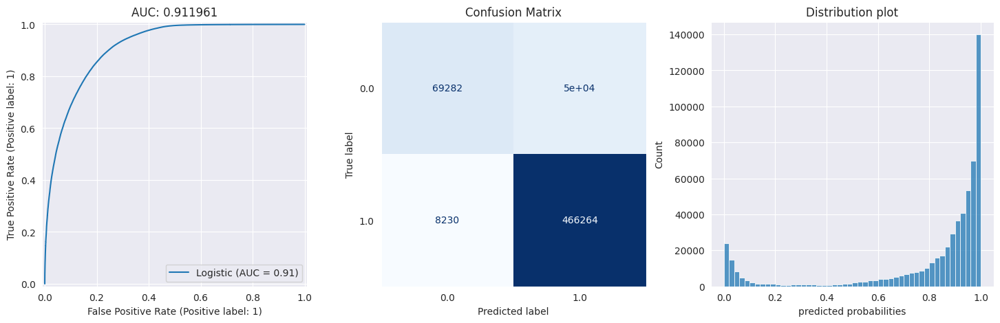

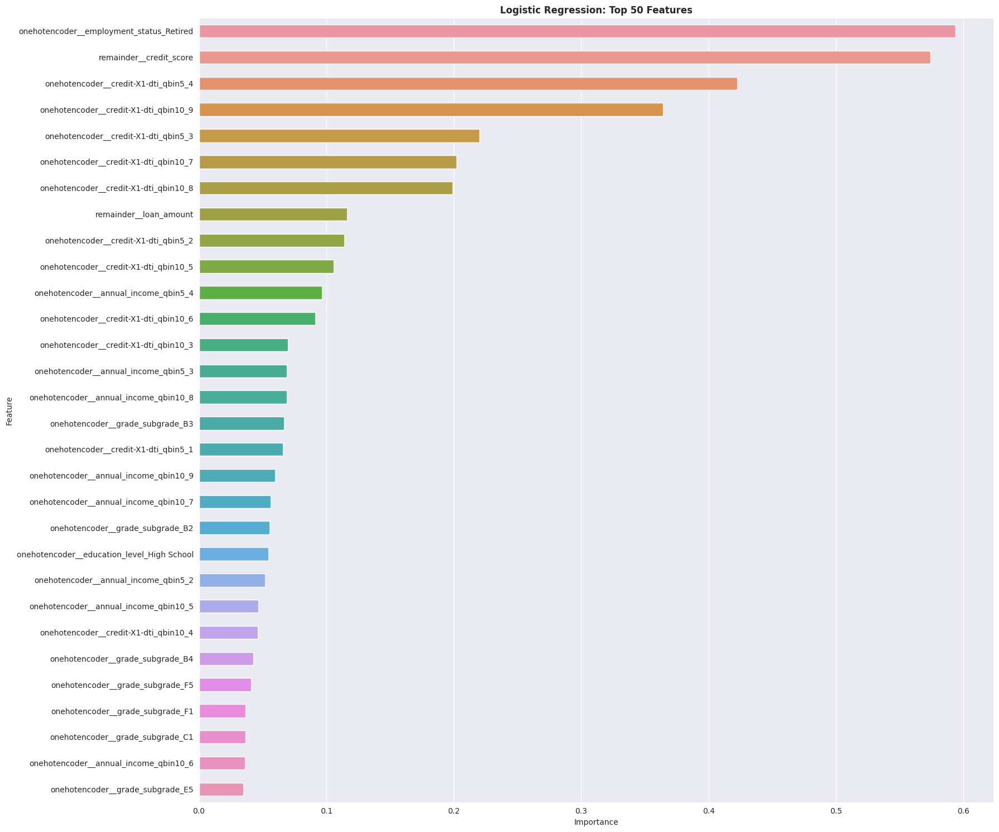

In [20]:
## -- After all folds --
print(f"|{'-'*30}")
overall_AUC = roc_auc_score(y, oof_preds)
features = models0['model-1'][0].get_feature_names_out(X.columns)
print(f"| Feature Out: {len(features)}")
print(f"| Overall AUC: {overall_AUC:.6f}")
print(f"| Average AUC: {np.mean(fold_scores):.6f} ± {np.std(fold_scores):.6f}")

print(f"|{'-'*30}")
pred_labels = (oof_preds >= 0.5).astype(int)
print(classification_report(y, pred_labels))

_, axs = plt.subplots(1, 3, figsize=(18, 5))
## -- ROC curve --
RocCurveDisplay.from_predictions(y, oof_preds, name='Logistic', ax=axs[0])
axs[0].set_title(f"AUC: {overall_AUC:.6f}")

## -- Confusion matrix (threshold = 0.5) --
ConfusionMatrixDisplay.from_predictions(y, pred_labels, cmap='Blues', colorbar=False, ax=axs[1])
axs[1].set_title(f"Confusion Matrix")
axs[1].grid(False)

## -- Distribution plot --
sns.histplot(oof_preds, bins=50, ax=axs[2])
axs[2].set_title(f"Distribution plot")
axs[2].set_xlabel(f"predicted probabilities")

## -- Plot feature importances --
plt.figure(figsize=(18, 15))

importances = models0['model-1'][-1].coef_[0]
imp = dict(Feature=features, Importance=importances)
imp_df = pd.DataFrame(imp).sort_values("Importance", ascending=False)

sns.barplot(data=imp_df.iloc[:30,:], x='Importance', y='Feature', width=0.5)
plt.title("Logistic Regression: Top 50 Features", fontweight='semibold')
plt.tight_layout()
plt.show()

In [21]:
## -- Create Submissions for each model --
s = str(overall_AUC).split('.')[1][:6]
np.save(f"oof_log_BASE_{s}.npy", oof_preds)
np.save(f"pred_log_BASE_{s}.npy", test_preds)
print(f"{COLOR}✅ oof & prediction files saved!")

# # submit[TARGET] = test_preds
# # submit.to_csv(f"submit_logistic_BASE_{s}.csv", index=False)

# # print(f"{COLOR}✅ submit_logistic_BASE_{s}.csv file saved!")

✅ oof & prediction files saved!


# ML TRAINING -|- OHE

In [22]:
## -- Define Training Parameters --
if torch.cuda.is_available():
    print(f"ℹ️ Device GPU: {torch.cuda.get_device_name(0)}")
    print(f"ℹ️ No. of CPU: {os.cpu_count()} cores")
else:
    print(f"ℹ️ Device: CPU {os.cpu_count()} cores")
## -----------------------------------------------------------------
models1 = {}
logit1 = LogisticRegression(
    max_iter=1000,
    solver='lbfgs',
    C=1e-3,
    tol=1e-5,
    n_jobs=3,
    random_state=SEED,
)

oof_preds  = np.zeros(len(X))
test_preds = np.zeros(len(test))
fold_scores = []

tik = time()
for fold, (train_idx, val_idx) in enumerate(kf.split(X, y)):
    print('|', '-'*20)
    print(f"Fold {fold+1}/{FOLDS}")
    X_train, X_val = X.iloc[train_idx].copy(), X.iloc[val_idx].copy()
    y_train, y_val = y.iloc[train_idx].copy(), y.iloc[val_idx].copy()

    ## -- Create pipeline --
    model = make_pipeline(
        make_column_transformer(
            (OneHotEncoder(
                handle_unknown='ignore',
                drop='first',
            ), CAT_COLS + BINS ),
            remainder='passthrough',
            # n_jobs=-1,
        ),
        StandardScaler(with_mean=False),
        logit1,
    )
    model.fit(X_train, y_train)

    y_pred = np.clip(model.predict_proba(X_val)[:, 1], 0, 1)
    oof_preds[val_idx] = y_pred

    predictions = np.clip(model.predict_proba(X_test)[:, 1], 0, 1)
    test_preds += predictions / FOLDS

    score = roc_auc_score(y_val, y_pred)
    fold_scores.append(score)
    models1[f"model-{fold+1}"] = model

    print(f"{COLOR}\tAUC: {score:.6f}{RESET}")
    # sleep(1); gc.collect(); sleep(2)

tok = time()
tiktok = (tok-tik) / 60
print('-'*20)
print(f"\tTraining Time: {tiktok:.2f} mins{RESET}")

ℹ️ Device: CPU 4 cores
| --------------------
Fold 1/10
	AUC: 0.925298
| --------------------
Fold 2/10
	AUC: 0.923236
| --------------------
Fold 3/10
	AUC: 0.925217
| --------------------
Fold 4/10
	AUC: 0.924667
| --------------------
Fold 5/10
	AUC: 0.921722
| --------------------
Fold 6/10
	AUC: 0.924551
| --------------------
Fold 7/10
	AUC: 0.923046
| --------------------
Fold 8/10
	AUC: 0.925722
| --------------------
Fold 9/10
	AUC: 0.923279
| --------------------
Fold 10/10
	AUC: 0.923999
--------------------
	Training Time: 4.55 mins


|------------------------------
| Feature Out: 2471
| Overall AUC: 0.924074
| Average AUC: 0.924074 ± 0.001184
|------------------------------
              precision    recall  f1-score   support

         0.0       0.87      0.64      0.74    119500
         1.0       0.91      0.98      0.94    474494

    accuracy                           0.91    593994
   macro avg       0.89      0.81      0.84    593994
weighted avg       0.91      0.91      0.90    593994



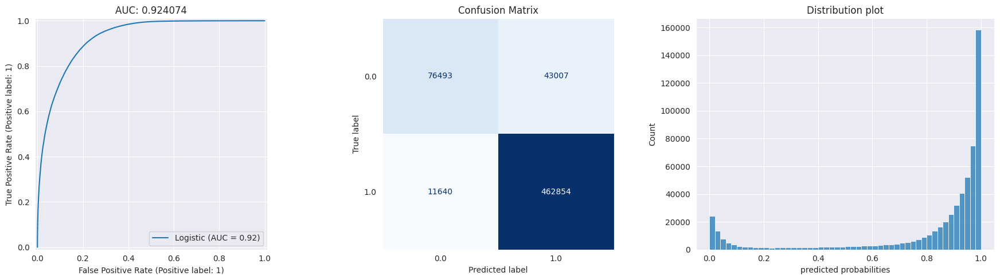

In [23]:
## -- After all folds --
print(f"|{'-'*30}")
overall_AUC = roc_auc_score(y, oof_preds)
features = models1['model-1'][0].get_feature_names_out(X.columns)
print(f"| Feature Out: {len(features)}")
print(f"| Overall AUC: {overall_AUC:.6f}")
print(f"| Average AUC: {np.mean(fold_scores):.6f} ± {np.std(fold_scores):.6f}")

print(f"|{'-'*30}")
pred_labels = (oof_preds >= 0.5).astype(int)
print(classification_report(y, pred_labels))

_, axs = plt.subplots(1, 3, figsize=(18, 5))
## -- ROC curve --
RocCurveDisplay.from_predictions(y, oof_preds, name='Logistic', ax=axs[0])
axs[0].set_title(f"AUC: {overall_AUC:.6f}")

## -- Confusion matrix (threshold = 0.5) --
ConfusionMatrixDisplay.from_predictions(y, pred_labels, cmap='Blues', colorbar=False, ax=axs[1])
axs[1].set_title(f"Confusion Matrix")
axs[1].grid(False)

## -- Distribution plot --
sns.histplot(oof_preds, bins=50, ax=axs[2])
axs[2].set_title(f"Distribution plot")
axs[2].set_xlabel(f"predicted probabilities")

# ## -- Plot feature importances --
# plt.figure(figsize=(18, 15))
# importances = models1['model-1'][-1].coef_[0]
# imp = dict(Feature=features, Importance=importances)
# imp_df = pd.DataFrame(imp).sort_values("Importance", ascending=False)
# sns.barplot(data=imp_df.iloc[:30,:], x='Importance', y='Feature', width=0.5)
# plt.title("Logistic Regression: Top 50 Features", fontweight='semibold')

plt.tight_layout()
plt.show()

### SUBMISSION

In [24]:
## -- Create Submissions for each model --
s = str(overall_AUC).split('.')[1][:6]
np.save(f"oof_log_OHE_{s}.npy", oof_preds)
np.save(f"pred_log_OHE_{s}.npy", test_preds)
print(f"{COLOR}✅ oof & prediction files saved!")

# submit[TARGET] = test_preds
# submit.to_csv(f"submit_logistic_OHE_{s}.csv", index=False)

# print(f"{COLOR}✅ submit_logistic_OHE_{s}.csv file saved!")

✅ oof & prediction files saved!


# ML TRAINING -|- TE

In [25]:
## -- Define Training Parameters --
if torch.cuda.is_available():
    print(f"ℹ️ Device GPU: {torch.cuda.get_device_name(0)}")
    print(f"ℹ️ No. of CPU: {os.cpu_count()} cores")
else:
    print(f"ℹ️ Device: CPU {os.cpu_count()} cores")
## -----------------------------------------------------------------
models2 = {}
logit2 = LogisticRegression(
    max_iter=1000,
    solver='liblinear',
    C=1e-3,
    tol=1e-5,
    n_jobs=3,
    random_state=SEED,
)

oof_preds  = np.zeros(len(X))
test_preds = np.zeros(len(test))
fold_scores = []

tik = time()
for fold, (train_idx, val_idx) in enumerate(kf.split(X, y)):
    print('|', '-'*20)
    print(f"Fold {fold+1}/{FOLDS}")
    X_train, X_val = X.iloc[train_idx].copy(), X.iloc[val_idx].copy()
    y_train, y_val = y.iloc[train_idx].copy(), y.iloc[val_idx].copy()

    ## -- Create pipeline --
    model = make_pipeline(
        make_column_transformer(
            (TargetEncoder(
                target_type='binary',
                random_state=SEED,
                smooth=10.0,
                cv=5,
            ), CAT_COLS + BINS ),
            remainder='passthrough',
            # n_jobs=-1,
        ),
        StandardScaler(),
        logit2,
    )
    model.fit(X_train, y_train)

    y_pred = np.clip(model.predict_proba(X_val)[:, 1], 0, 1)
    oof_preds[val_idx] = y_pred

    predictions = np.clip(model.predict_proba(X_test)[:, 1], 0, 1)
    test_preds += predictions / FOLDS

    score = roc_auc_score(y_val, y_pred)
    fold_scores.append(score)
    models2[f"model-{fold+1}"] = model

    print(f"{COLOR}\tAUC: {score:.6f}{RESET}")
    # sleep(1); gc.collect(); sleep(2)

tok = time()
tiktok = (tok-tik) / 60
print('-'*20)
print(f"\tTraining Time: {tiktok:.2f} mins{RESET}")

ℹ️ Device: CPU 4 cores
| --------------------
Fold 1/10
	AUC: 0.922570
| --------------------
Fold 2/10
	AUC: 0.920154
| --------------------
Fold 3/10
	AUC: 0.922172
| --------------------
Fold 4/10
	AUC: 0.921460
| --------------------
Fold 5/10
	AUC: 0.918933
| --------------------
Fold 6/10
	AUC: 0.921709
| --------------------
Fold 7/10
	AUC: 0.920374
| --------------------
Fold 8/10
	AUC: 0.922407
| --------------------
Fold 9/10
	AUC: 0.920284
| --------------------
Fold 10/10
	AUC: 0.921141
--------------------
	Training Time: 1.48 mins


|------------------------------
| Feature Out: 23
| Overall AUC: 0.921120
| Average AUC: 0.921121 ± 0.001109
|------------------------------
              precision    recall  f1-score   support

         0.0       0.84      0.65      0.74    119500
         1.0       0.92      0.97      0.94    474494

    accuracy                           0.91    593994
   macro avg       0.88      0.81      0.84    593994
weighted avg       0.90      0.91      0.90    593994



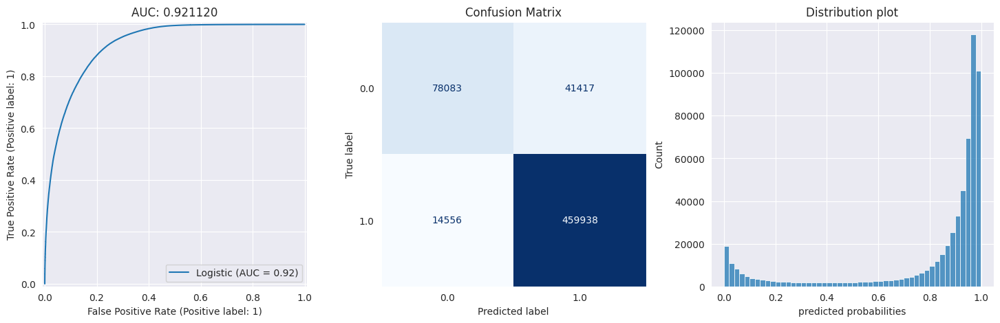

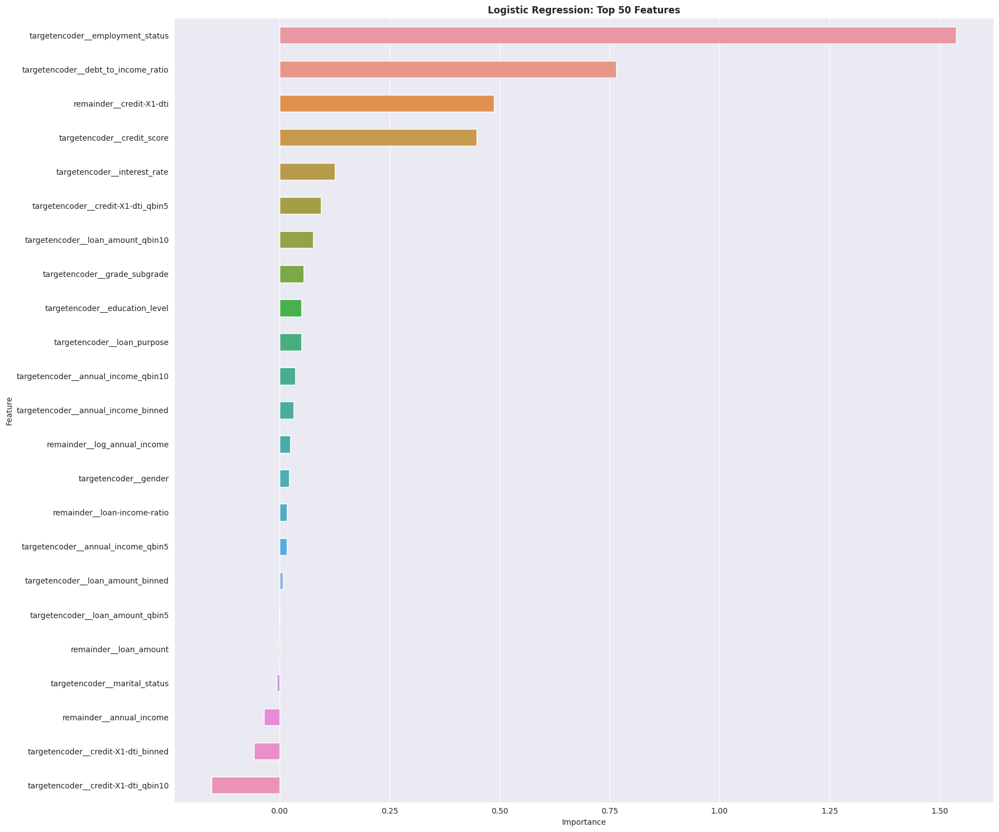

In [26]:
## -- After all folds --
print(f"|{'-'*30}")
overall_AUC = roc_auc_score(y, oof_preds)
features = models2['model-1'][0].get_feature_names_out(X.columns)
print(f"| Feature Out: {len(features)}")
print(f"| Overall AUC: {overall_AUC:.6f}")
print(f"| Average AUC: {np.mean(fold_scores):.6f} ± {np.std(fold_scores):.6f}")

print(f"|{'-'*30}")
pred_labels = (oof_preds >= 0.5).astype(int)
print(classification_report(y, pred_labels))

_, axs = plt.subplots(1, 3, figsize=(18, 5))
## -- ROC curve --
RocCurveDisplay.from_predictions(y, oof_preds, name='Logistic', ax=axs[0])
axs[0].set_title(f"AUC: {overall_AUC:.6f}")

## -- Confusion matrix (threshold = 0.5) --
ConfusionMatrixDisplay.from_predictions(y, pred_labels, cmap='Blues', colorbar=False, ax=axs[1])
axs[1].set_title(f"Confusion Matrix")
axs[1].grid(False)

## -- Distribution plot --
sns.histplot(oof_preds, bins=50, ax=axs[2])
axs[2].set_title(f"Distribution plot")
axs[2].set_xlabel(f"predicted probabilities")

## -- Plot feature importances --
plt.figure(figsize=(18, 15))

importances = models2['model-1'][-1].coef_[0]
imp = dict(Feature=features, Importance=importances)
imp_df = pd.DataFrame(imp).sort_values("Importance", ascending=False)

sns.barplot(data=imp_df.iloc[:30,:], x='Importance', y='Feature', width=0.5)
plt.title("Logistic Regression: Top 50 Features", fontweight='semibold')
plt.tight_layout()
plt.show()

### SUBMISSION

In [27]:
## -- Create Submissions for each model --
s = str(overall_AUC).split('.')[1][:6]
np.save(f"oof_log_TE_{s}.npy", oof_preds)
np.save(f"pred_log_TE_{s}.npy", test_preds)
print(f"{COLOR}✅ oof & prediction files saved!")

# submit[TARGET] = test_preds
# submit.to_csv(f"submit_logistic_TE_{s}.csv", index=False)

# print(f"{COLOR}✅ submit_logistic_TE_{s}.csv file saved!")

✅ oof & prediction files saved!


# ML TRAINING -|- TE + OHE

In [28]:
## -- Define Training Parameters --
if torch.cuda.is_available():
    print(f"ℹ️ Device GPU: {torch.cuda.get_device_name(0)}")
    print(f"ℹ️ No. of CPU: {os.cpu_count()} cores")
else:
    print(f"ℹ️ Device: CPU {os.cpu_count()} cores")
## -----------------------------------------------------------------
models3 = {}
logit3 = LogisticRegression(
    max_iter=1000,
    solver='lbfgs',
    C=0.01,
    tol=1e-5,
    n_jobs=3,
    random_state=SEED,
)
oof_preds  = np.zeros(len(X))
test_preds = np.zeros(len(test))
fold_scores = []

tik = time()
for fold, (train_idx, val_idx) in enumerate(kf.split(X, y)):
    print('|', '-'*20)
    print(f"Fold {fold+1}/{FOLDS}")
    X_train, X_val = X.iloc[train_idx].copy(), X.iloc[val_idx].copy()
    y_train, y_val = y.iloc[train_idx].copy(), y.iloc[val_idx].copy()

    ## -- Create pipeline --
    model = make_pipeline(
        make_column_transformer(
            (OneHotEncoder(
                handle_unknown='ignore',
                drop='first',
            ), CATS + BINS ),
            (TargetEncoder(
                target_type='binary',
                random_state=SEED,
                smooth=6.0,
                cv=5,
            ), ['credit_score', 'debt_to_income_ratio', 'interest_rate'] ),
            remainder='passthrough',
            # n_jobs=-1,
        ),
        StandardScaler(with_mean=False),
        logit3,
    )
    model.fit(X_train, y_train)

    y_pred = np.clip(model.predict_proba(X_val)[:, 1], 0, 1)
    oof_preds[val_idx] = y_pred

    predictions = np.clip(model.predict_proba(X_test)[:, 1], 0, 1)
    test_preds += predictions / FOLDS

    score = roc_auc_score(y_val, y_pred)
    fold_scores.append(score)
    models3[f"model-{fold+1}"] = model

    print(f"{COLOR}\tAUC: {score:.6f}{RESET}")
    # sleep(1); gc.collect(); sleep(2)

tok = time()
tiktok = (tok-tik) / 60
print('-'*20)
print(f"\tTraining Time: {tiktok:.2f} mins{RESET}")

ℹ️ Device: CPU 4 cores
| --------------------
Fold 1/10
	AUC: 0.924589
| --------------------
Fold 2/10
	AUC: 0.922560
| --------------------
Fold 3/10
	AUC: 0.924101
| --------------------
Fold 4/10
	AUC: 0.923305
| --------------------
Fold 5/10
	AUC: 0.920500
| --------------------
Fold 6/10
	AUC: 0.923681
| --------------------
Fold 7/10
	AUC: 0.922145
| --------------------
Fold 8/10
	AUC: 0.924379
| --------------------
Fold 9/10
	AUC: 0.921853
| --------------------
Fold 10/10
	AUC: 0.922755
--------------------
	Training Time: 10.90 mins


|------------------------------
| Feature Out: 111
| Overall AUC: 0.922984
| Average AUC: 0.922987 ± 0.001214
|------------------------------
              precision    recall  f1-score   support

         0.0       0.86      0.64      0.74    119500
         1.0       0.92      0.97      0.94    474494

    accuracy                           0.91    593994
   macro avg       0.89      0.81      0.84    593994
weighted avg       0.91      0.91      0.90    593994



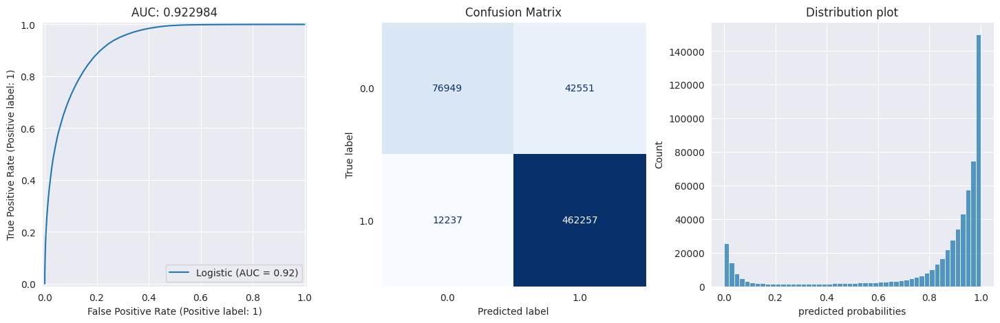

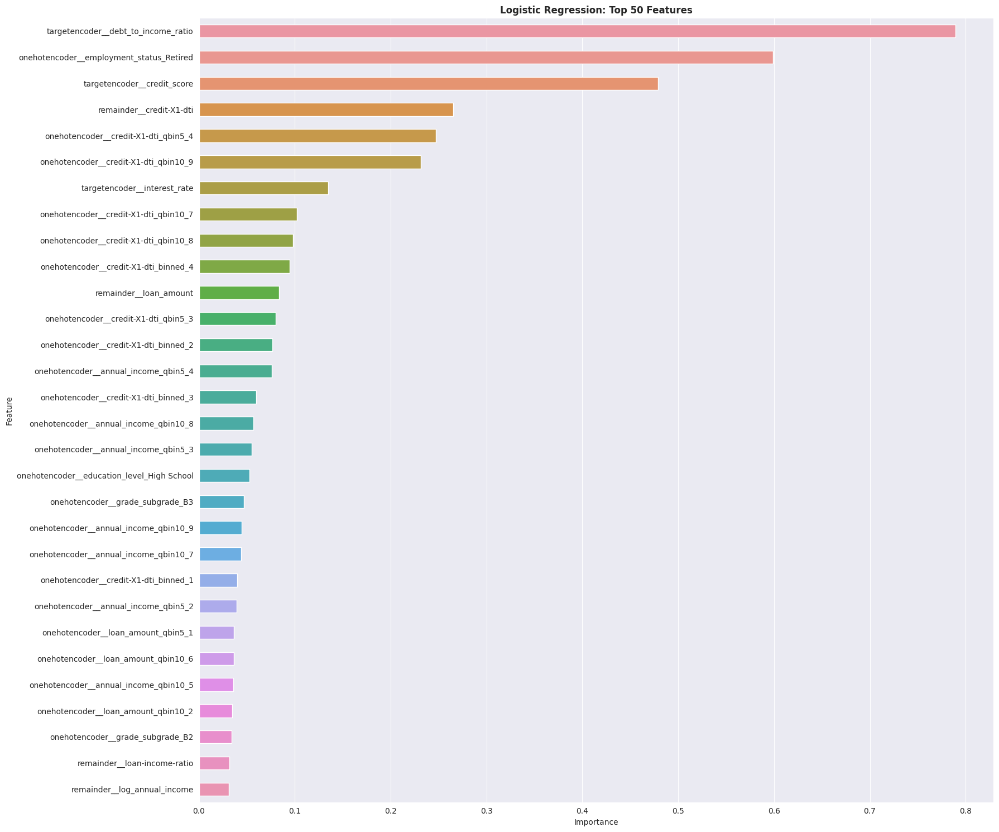

In [29]:
## -- After all folds --
print(f"|{'-'*30}")
overall_AUC = roc_auc_score(y, oof_preds)
features = models3['model-1'][0].get_feature_names_out(X.columns)
print(f"| Feature Out: {len(features)}")
print(f"| Overall AUC: {overall_AUC:.6f}")
print(f"| Average AUC: {np.mean(fold_scores):.6f} ± {np.std(fold_scores):.6f}")

print(f"|{'-'*30}")
pred_labels = (oof_preds >= 0.5).astype(int)
print(classification_report(y, pred_labels))

_, axs = plt.subplots(1, 3, figsize=(18, 5))
## -- ROC curve --
RocCurveDisplay.from_predictions(y, oof_preds, name='Logistic', ax=axs[0])
axs[0].set_title(f"AUC: {overall_AUC:.6f}")

## -- Confusion matrix (threshold = 0.5) --
ConfusionMatrixDisplay.from_predictions(y, pred_labels, cmap='Blues', colorbar=False, ax=axs[1])
axs[1].set_title(f"Confusion Matrix")
axs[1].grid(False)

## -- Distribution plot --
sns.histplot(oof_preds, bins=50, ax=axs[2])
axs[2].set_title(f"Distribution plot")
axs[2].set_xlabel(f"predicted probabilities")

## -- Plot feature importances --
plt.figure(figsize=(18, 15))

importances = models3['model-1'][-1].coef_[0]
imp = dict(Feature=features, Importance=importances)
imp_df = pd.DataFrame(imp).sort_values("Importance", ascending=False)

sns.barplot(data=imp_df.iloc[:30,:], x='Importance', y='Feature', width=0.5)
plt.title("Logistic Regression: Top 50 Features", fontweight='semibold')
plt.tight_layout()
plt.show()

### SUBMISSION

In [30]:
## -- Create Submissions for each model --
s = str(overall_AUC).split('.')[1][:6]
np.save(f"oof_log_TEOHE_{s}.npy", oof_preds)
np.save(f"pred_log_TEOHE_{s}.npy", test_preds)
print(f"{COLOR}✅ oof & prediction files saved!")

# submit[TARGET] = test_preds
# submit.to_csv(f"submit_logistic_TE+OHE_{s}.csv", index=False)

# print(f"{COLOR}✅ submit_logistic_TE+OHE_{s}.csv file saved!")

✅ oof & prediction files saved!


# HILLCLIMB

In [31]:
oof_df = pd.DataFrame()
pred_df = pd.DataFrame()
print("Loading data: ", end="")
for (root, dirs, files) in os.walk("/kaggle/working"):
    for i, file in enumerate(sorted(files), 1):
        if i%10 == 0: print(f"{i}%.. ", end="")
        if file.endswith(".npy") and "oof" in file:
            oof_df = pd.concat([oof_df, pd.Series(np.load(os.path.join(root, file)), name=file[4:])], axis=1)
        elif file.endswith(".npy") and "pred" in file:
            pred_df = pd.concat([pred_df, pd.Series(np.load(os.path.join(root, file)), name=file[5:])], axis=1)

print(COLOR)
print(f"Total oof models : {len(oof_df.columns)}")
print(f"Total pred models: {len(pred_df.columns)}")
display(oof_df.head())
display(pred_df.head())

Loading data: 
Total oof models : 4
Total pred models: 4


,log_BASE_911961.npy,log_OHE_924074.npy,log_TEOHE_922983.npy,log_TE_921120.npy
0,0.988403,0.978887,0.984825,0.971226
1,0.723679,0.418043,0.585068,0.603200
2,0.962443,0.954554,0.960573,0.960296
3,0.816281,0.868355,0.838068,0.795965
4,0.966908,0.982390,0.976889,0.971360


,log_BASE_911961.npy,log_OHE_924074.npy,log_TEOHE_922983.npy,log_TE_921120.npy
0,0.930284,0.947673,0.943947,0.944965
1,0.988296,0.983699,0.985604,0.969242
2,0.286694,0.537438,0.368081,0.293475
3,0.912386,0.817300,0.927179,0.942486
4,0.973837,0.959774,0.970156,0.966272


In [32]:
%%time
phc_pred = climb_hill(
                               train = trn,
                              target = TARGET,
                         oof_pred_df = oof_df,
                        test_pred_df = pred_df,
                           objective = "maximize",
                         eval_metric = partial(roc_auc_score),
                    # negative_weights = True,
                    # return_oof_preds = True,
                           precision = 0.001,
                           plot_hill = True,
                           plot_hist = True,
    )

   /\  
  /__\  hillclimbers 
 /    \
/______\ 

Models to be ensembled | (4 total): 

log_OHE_924074.npy:   0.92407 (best solo model)
log_TEOHE_922983.npy: 0.92298
log_TE_921120.npy:    0.92112
log_BASE_911961.npy:  0.91196

[Data preparation completed successfully] - [Initiate hill climbing] 

Iteration: 1 | Model added: log_TEOHE_922983.npy | Best weight: 0.308 | Best roc_auc_score: 0.92447


CPU times: user 12min 39s, sys: 2.78 s, total: 12min 42s
Wall time: 11min 32s


In [33]:
submit[TARGET] = phc_pred
submit.to_csv(f"submit_HC_Logistic4MODELS.csv", index=False)
print(f"✅ Saved hillclimb predictions!!!")

✅ Saved hillclimb predictions!!!
